In [1]:
import time

import numpy as np

from scipy import special, integrate, spatial, stats

import sympy
from sympy.printing.numpy import SciPyPrinter

from astropy import units as u

In [2]:
from matplotlib import pyplot as plt 

In [3]:
import nautilus 
import corner

See [green_integral_test.ipynb](green_integral_test.ipynb) for some starting points/tests.

# Helper functions

In [4]:
BN_ICOEFFS = [2, -1/3, 4/405, 46/25515, 131/1148175, -2194697/30690717750]

def f_bn(n):
    """
    Ciotti and Bertin 99, valid for n >~ 0.36
    """
    return np.sum([C*n**(1-i) for i, C in enumerate(BN_ICOEFFS)], axis=0)

def sersic_profile(R, Ie, Re, n):
    bn = f_bn(n)
    return Ie * np.exp(-bn*((R/Re)**(1/n)-1))

def log_sersic_profile(R, Ie, Re, n):
    bn = f_bn(n)
    return np.log(Ie) - bn*((R/Re)**(1/n)-1)

In [5]:
def sersic_distribution(U, Re, n, Router=np.inf):
    bn = f_bn(n)

    #Iemax = 1/finteg(Router, Re, n, bn, 1)
    integral = Re**2*bn**(-2*n)*n*np.exp(bn)*special.gamma(2*n)*special.gammainc(2*n, Re**(-1/n)*bn*Router**(n**(-1.0)))
    IEmax = 1/integral

    #sympy_gamma =  U*bn**(2*n)*np.exp(-bn)/(Iemax*Re**2*n)
    sympy_gamma =  U*bn**(2*n)*np.exp(-bn)/(Re**2*n) * integral

    gamma_arg = special.gammaincinv(2*n, sympy_gamma / special.gamma(2*n))
    return Re*(gamma_arg/bn)**n

## Data simulation

In [6]:
def sersic_plus_uniform_box(ntotal, fbkg, n, Re=1, Router=10):
    nbkg = int(ntotal*fbkg)
    nfg = ntotal - nbkg

    x_bkg = np.random.rand(nbkg)*Router*2 - Router
    y_bkg = np.random.rand(nbkg)*Router*2 - Router

    r_fg = sersic_distribution(np.random.rand(nfg), Re, n, Router)
    θ_fg = np.random.rand(nfg)*2*np.pi
    
    x_fg = r_fg*np.cos(θ_fg)
    y_fg = r_fg*np.sin(θ_fg)

    return np.concatenate([x_fg, x_bkg]), np.concatenate([y_fg, y_bkg]), nfg

def sersic_plus_uniform_circle(ntotal, fbkg, n, Re=1, Router=10, x0=0, y0=0):
    nbkg = int(ntotal*fbkg)
    nfg = ntotal - nbkg

    r_bkg = np.sqrt(np.random.rand(nbkg))*Router
    θ_bkg = np.random.rand(nbkg)*2*np.pi

    r_fg = sersic_distribution(np.random.rand(nfg), Re, n, Router)
    θ_fg = np.random.rand(nfg)*2*np.pi

    r, θ = np.concatenate([r_fg, r_bkg]), np.concatenate([θ_fg, θ_bkg])

    x = r*np.cos(θ)
    y = r*np.sin(θ)

    x[:nfg] += x0
    y[:nfg] += y0

    return x, y, nfg

In [7]:
def dimensionless_path_integrand(x, y, Δx, Δy, Re, n):
    bn = f_bn(n)
    Rsq = x*x + y*y
    twon = 2*n
    segments = Re**2*bn**(-twon)*n*(x*Δy - y*Δx)*np.exp(bn)*special.gamma(twon)*special.gammainc(twon, Re**(-1/n)*bn*Rsq**(1/twon))/Rsq
    return np.sum(segments)

def sersic_integrate_hull(hull, n_per_segment, n, Re):
    vertxys = hull.points[hull.vertices].T
    edgexys = np.linspace(vertxys, np.roll(vertxys,-1, axis=-1), n_per_segment).T
    integral_of_segments = [dimensionless_path_integrand(x, y, x[1]-x[0], y[1]-y[0], Re=Re, n=n) for x,y in edgexys]
    return np.sum(integral_of_segments)


For a gaussian, this parametrization of sersic has $b_n = \log(2)$ which means there's a factor of that difference between that and the standard gaussian integral.  Check that the above reproduces that:

In [8]:
Router = 10
theta = np.linspace(0, 2*np.pi, 100)

x = Router * np.cos(theta)
y = Router * np.sin(theta)

hull_circ = spatial.ConvexHull(np.array((x, y)).T)

sersic_integrate_hull(hull_circ, 10000, 0.5, 1), 2*np.pi / np.log(2)

(np.float64(9.064613104022602), np.float64(9.064720283654388))

Checks out! (but note it is pretty sensitive to `n_per_segment`)

# Inference on simulated data

''

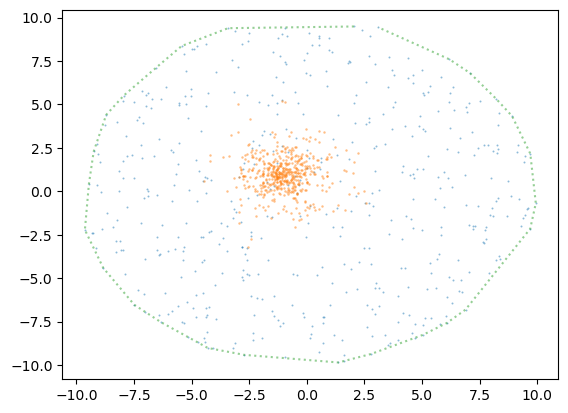

In [9]:
x0 = -1
y0 = 1
Re = 1
n = 1
fbkg = 0.5

nstars = 1000
Router = 10

x, y, truenfg = sersic_plus_uniform_circle(nstars, fbkg, n=n, Re=Re, Router=Router, x0=x0, y0=y0)

xy_hull = spatial.ConvexHull(np.array((x, y)).T)

assert (nstars-truenfg) == fbkg*nstars, f'{nstars-truenfg} != {fbkg*nstars}'

plt.scatter(x[(truenfg-nstars):], y[(truenfg-nstars):], s=2, alpha=0.5, lw=0)
plt.scatter(x[:truenfg], y[:truenfg], s=3, alpha=0.5, lw=0)
plt.plot(*xy_hull.points[xy_hull.vertices].T, ':', alpha=.5, c='C2')
;

In [10]:
baseline_prior = nautilus.Prior()

baseline_prior.add_parameter('x0', (-2, 2))
baseline_prior.add_parameter('y0', (-2, 2))
baseline_prior.add_parameter('Re', (0.1, 2))
baseline_prior.add_parameter('n', (0.36, 4))
baseline_prior.add_parameter('fbkg', (0.1, 0.9))

def loglikes(param_dict, data, hull, n_per_segment, noglx=False):
    x0 = param_dict['x0']
    y0 = param_dict['y0']
    Re = param_dict['Re']
    n = param_dict['n']
    fbkg = param_dict['fbkg']

    logbg = -np.log(hull.volume) #"volume" of a hull is actually 2d area THIS IS THE KEY DIFFERENCE!

    if noglx:
        return logbg*np.ones_like(data[0])
    
    R = np.hypot(data[0]-x0, data[1]-y0)

    logfg = log_sersic_profile(R, 1, Re, n) - np.log(sersic_integrate_hull(hull, n_per_segment, n, Re))
 
    return np.logaddexp(np.log(1-fbkg) + logfg, np.log(fbkg) + logbg)

def loglike(*args, **kwargs):
    return np.sum(loglikes(*args, **kwargs))


In [11]:
sampler = nautilus.Sampler(baseline_prior, loglike, 
                           likelihood_kwargs=dict(data=(x, y), hull=xy_hull, n_per_segment=1000),
                           n_live=1000, pool=12)
t_start = time.time()
sampler.run(verbose=True)
t_end = time.time()
print('Total time: {:.1f}s'.format(t_end - t_start))

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 28     | 1        | 4        | 31752    | N/A    | 10085 | -4818.83 
Total time: 41.5s


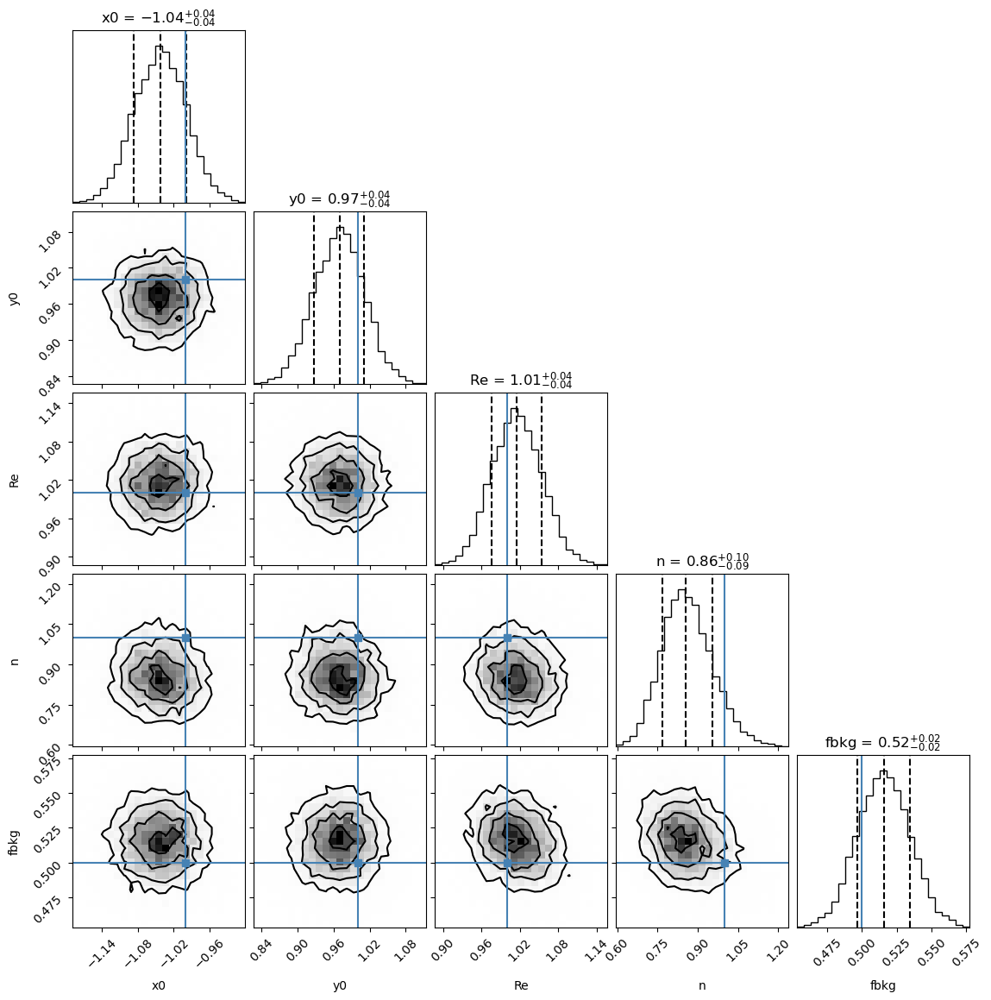

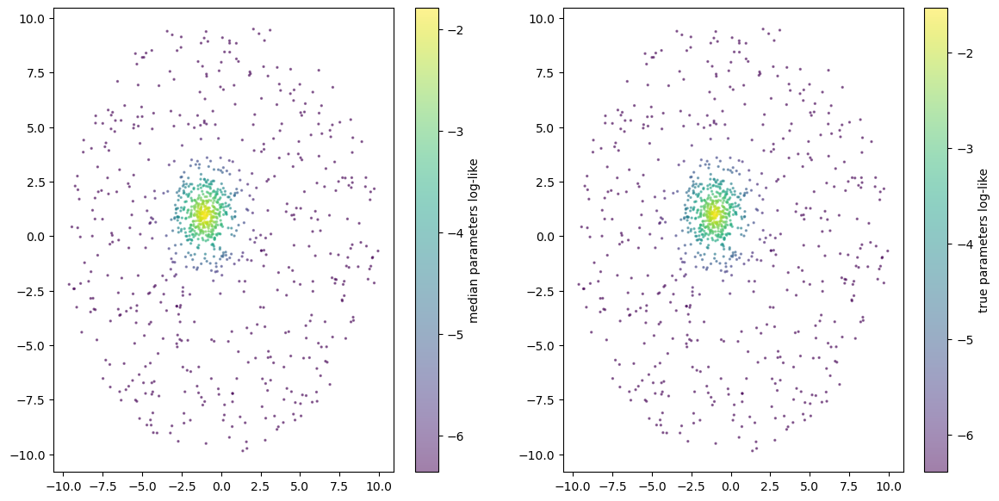

In [12]:
def plot_results(sampler, truths=[x0, y0, Re, n, fbkg], showsky=True):
    points, log_w, log_l = sampler.posterior()
    w = np.exp(log_w)
    corner.corner(
        points, weights=w, bins=25, labels=sampler.prior.keys,
        plot_datapoints=False, range=np.repeat(0.999, len(sampler.prior.keys)), 
        quantiles=[0.16, 0.5, 0.84],
        show_titles=True,
        truths=truths)

    if showsky:
        _, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))

        meddct = {k:v for k, v in zip(sampler.prior.keys, np.percentile(points, 50,  weights=w, method='inverted_cdf', axis=0))}

        sc1 = ax1.scatter(x, y, c=loglikes(meddct,data=(x, y), hull=xy_hull, n_per_segment=1000), s=2, alpha=.5)
        plt.colorbar(sc1, ax=ax1).set_label('median parameters log-like')

        sc2 = ax2.scatter(x, y, c=loglikes({k:v for k, v in zip(sampler.prior.keys, truths)},data=(x, y), hull=xy_hull, n_per_segment=1000), s=2, alpha=.5)
        plt.colorbar(sc2, ax=ax2).set_label('true parameters log-like')

plot_results(sampler)

Try alternative more restrictive priors

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 24     | 1        | 4        | 28512    | N/A    | 10070 | -4816.35 
Total time: 32.8s


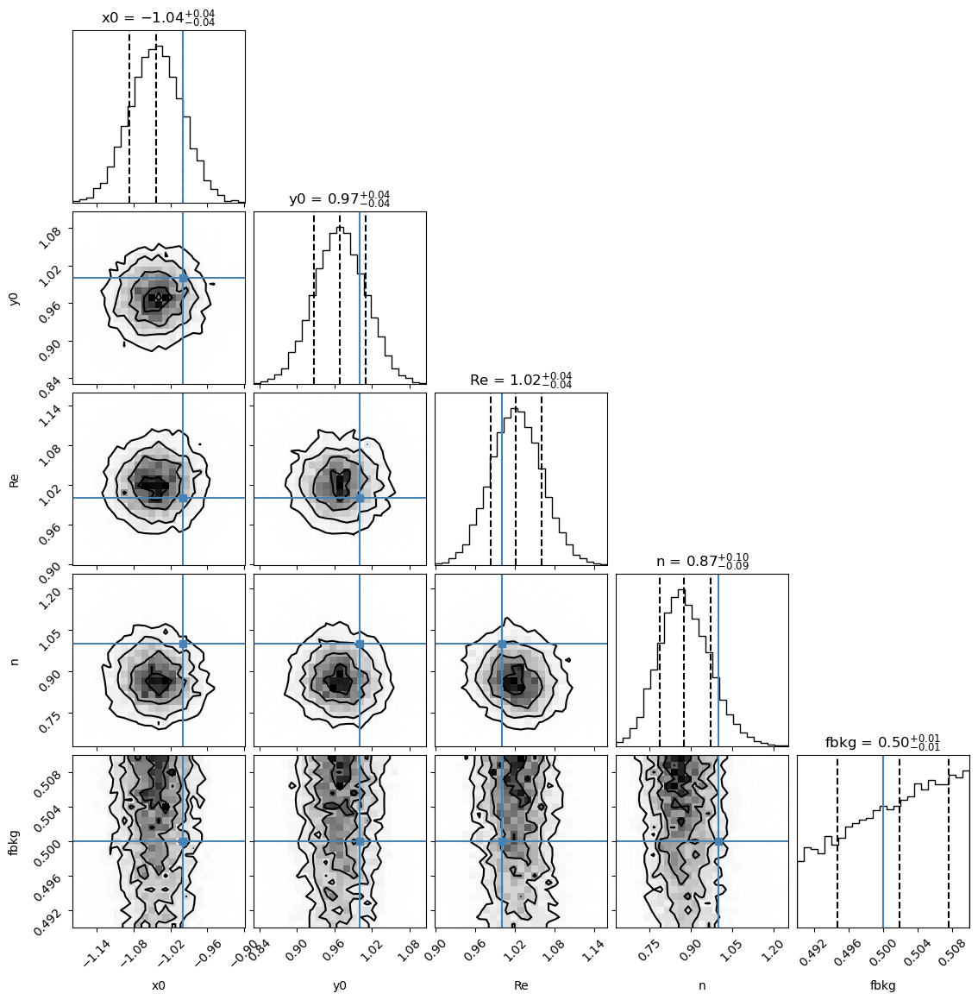

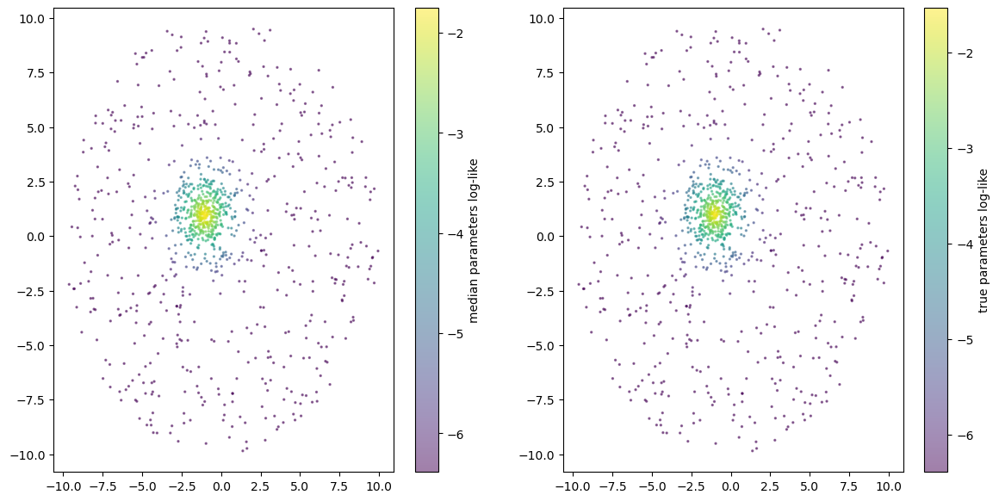

In [13]:
prior1 = nautilus.Prior()

prior1.add_parameter('x0', (-2, 2))
prior1.add_parameter('y0', (-2, 2))
prior1.add_parameter('Re', (0.1, 2))
prior1.add_parameter('n', (0.36, 4))
prior1.add_parameter('fbkg', (0.49, 0.51))


sampler1 = nautilus.Sampler(prior1, loglike, 
                           likelihood_kwargs=dict(data=(x, y), hull=xy_hull, n_per_segment=1000),
                           n_live=1000, pool=12)
t_start = time.time()
sampler1.run(verbose=True)
t_end = time.time()
print('Total time: {:.1f}s'.format(t_end - t_start))

plot_results(sampler1)

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 24     | 1        | 4        | 28080    | N/A    | 10034 | -4817.21 
Total time: 29.9s


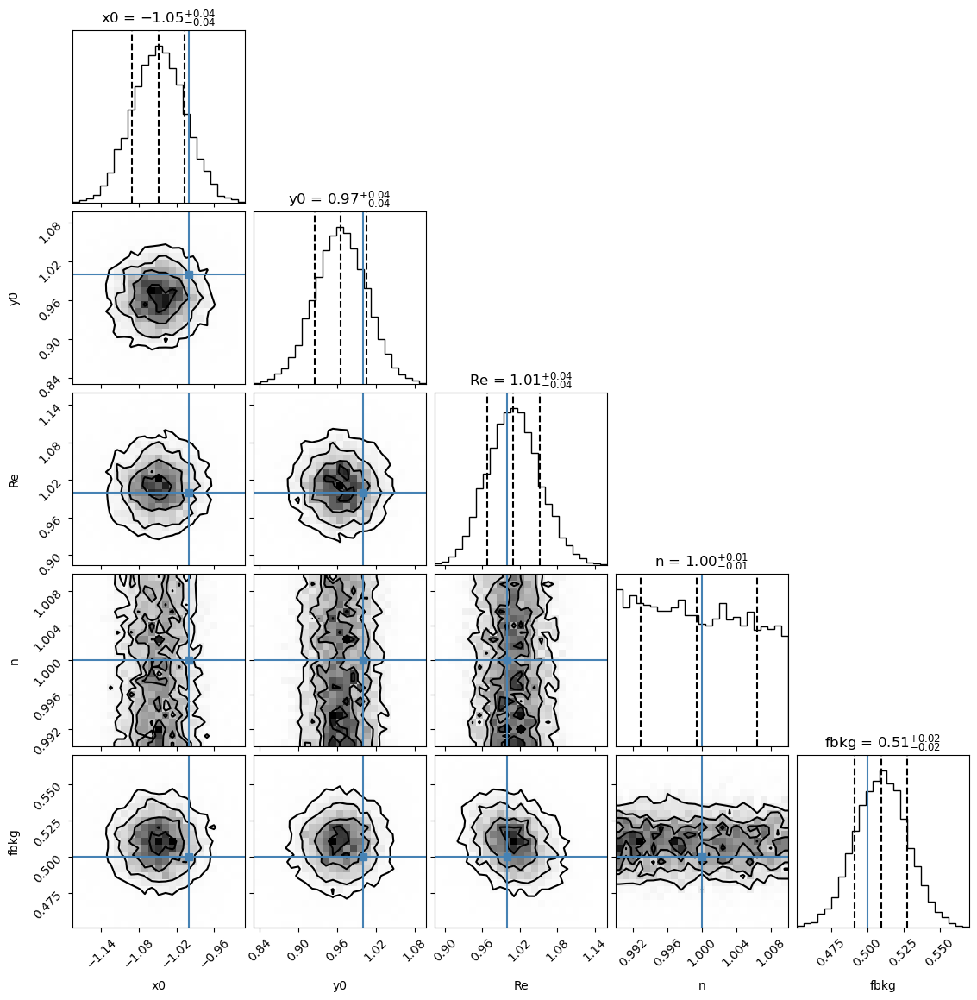

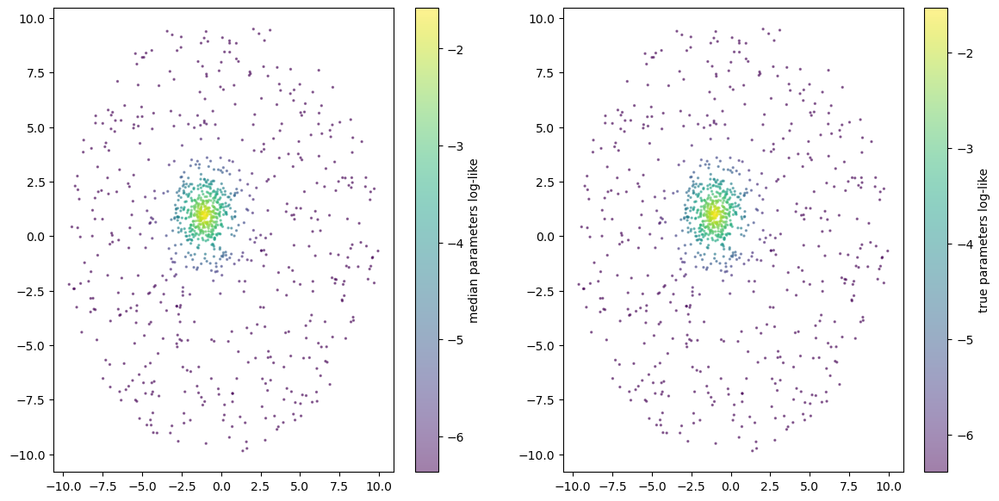

In [14]:
prior2 = nautilus.Prior()

prior2.add_parameter('x0', (-2, 2))
prior2.add_parameter('y0', (-2, 2))
prior2.add_parameter('Re', (0.1, 2))
prior2.add_parameter('n', (0.99, 1.01))
prior2.add_parameter('fbkg', (0.1, 0.9))


sampler2 = nautilus.Sampler(prior2, loglike, 
                           likelihood_kwargs=dict(data=(x, y), hull=xy_hull, n_per_segment=1000),
                           n_live=1000, pool=12)
t_start = time.time()
sampler2.run(verbose=True)
t_end = time.time()
print('Total time: {:.1f}s'.format(t_end - t_start))

plot_results(sampler2)

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 24     | 1        | 4        | 28080    | N/A    | 10018 | -4816.14 
Total time: 30.7s


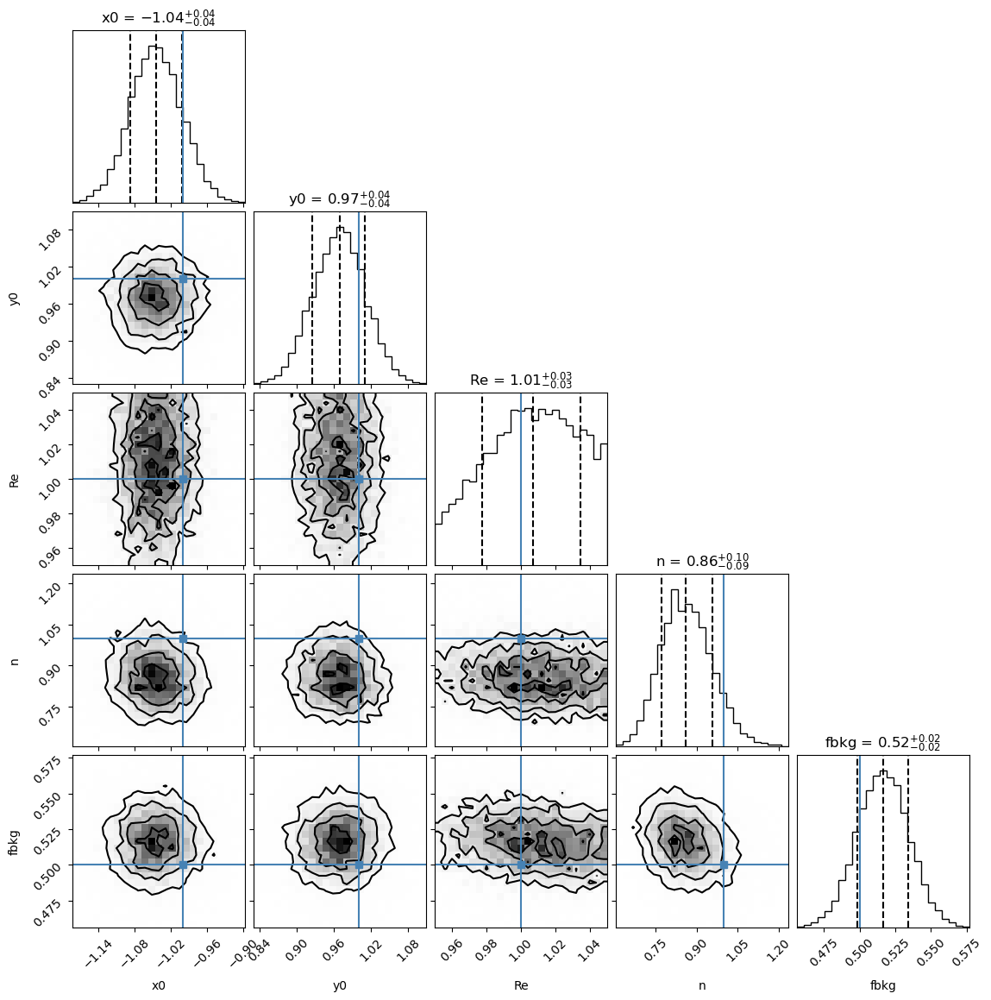

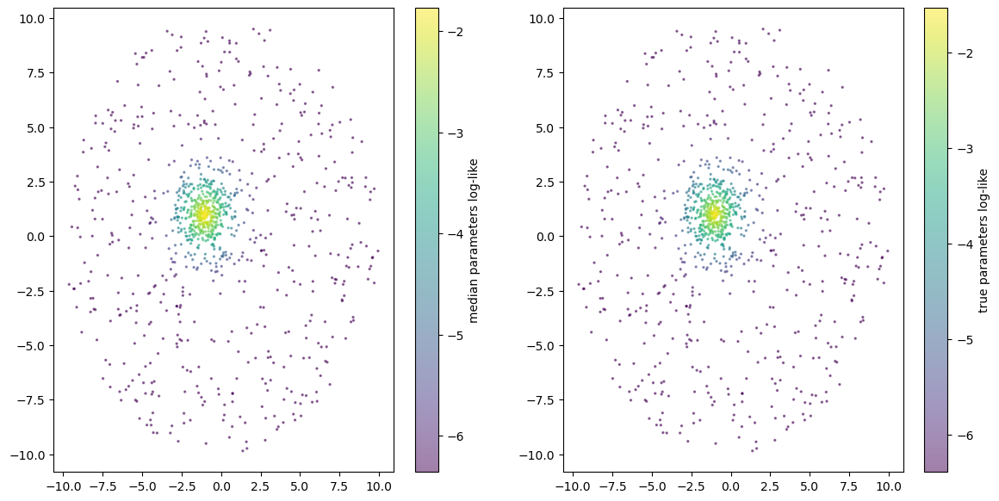

In [15]:
prior3 = nautilus.Prior()

prior3.add_parameter('x0', (-2, 2))
prior3.add_parameter('y0', (-2, 2))
prior3.add_parameter('Re', (.95, 1.05))
prior3.add_parameter('n', (0.36, 4))
prior3.add_parameter('fbkg', (0.1, 0.9))


sampler3 = nautilus.Sampler(prior3, loglike, 
                           likelihood_kwargs=dict(data=(x, y), hull=xy_hull, n_per_segment=1000),
                           n_live=1000, pool=12)
t_start = time.time()
sampler3.run(verbose=True)
t_end = time.time()
print('Total time: {:.1f}s'.format(t_end - t_start))

plot_results(sampler3)

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 21     | 1        | 4        | 25164    | N/A    | 10132 | -4814.33 
Total time: 28.1s


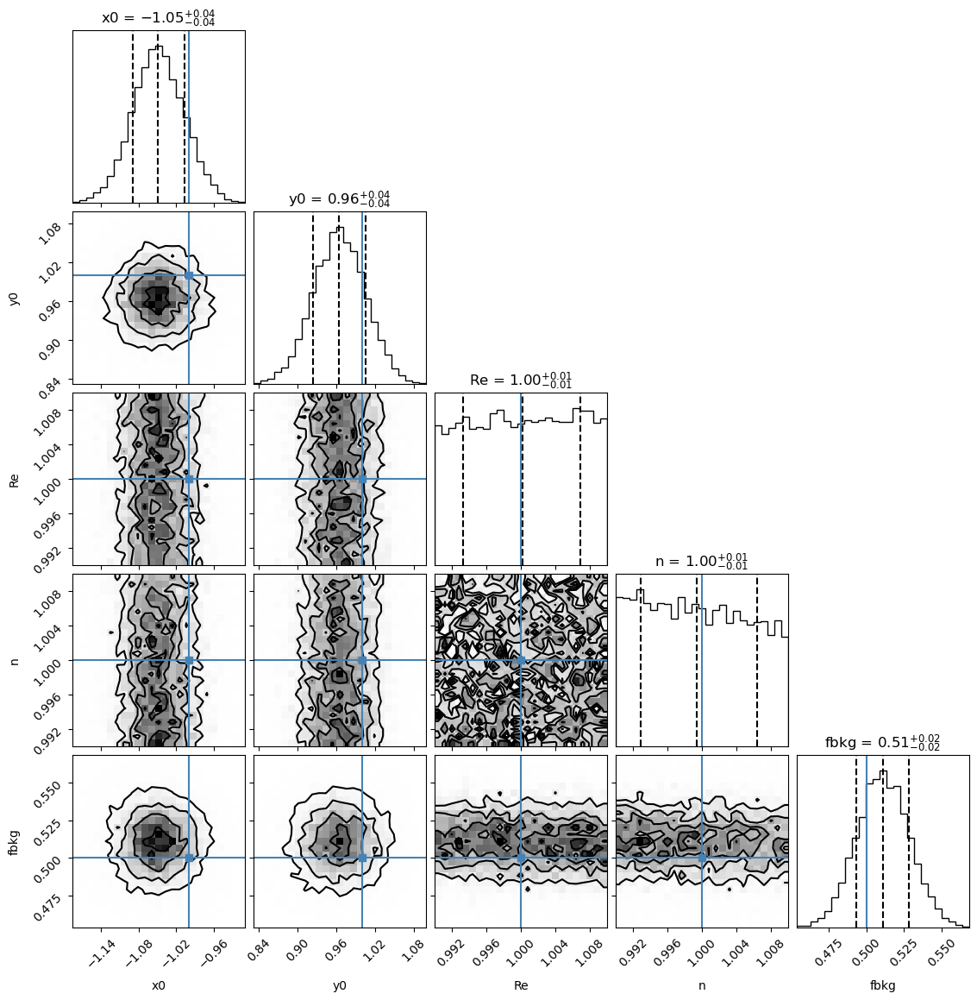

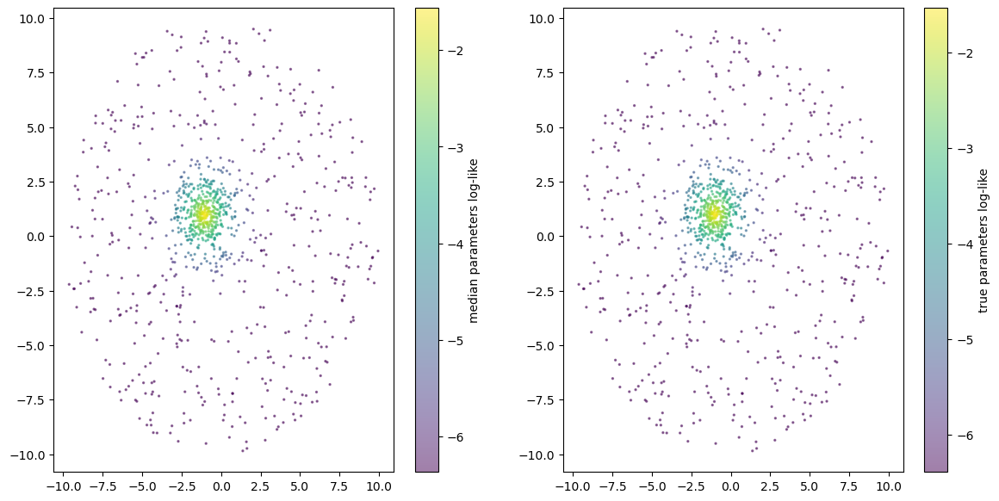

In [16]:
prior4 = nautilus.Prior()

prior4.add_parameter('x0', (-2, 2))
prior4.add_parameter('y0', (-2, 2))
prior4.add_parameter('Re', (0.99, 1.01))
prior4.add_parameter('n', (0.99, 1.01))
prior4.add_parameter('fbkg', (0.1, 0.9))


sampler4 = nautilus.Sampler(prior4, loglike, 
                           likelihood_kwargs=dict(data=(x, y), hull=xy_hull, n_per_segment=1000),
                           n_live=1000, pool=12)
t_start = time.time()
sampler4.run(verbose=True)
t_end = time.time()
print('Total time: {:.1f}s'.format(t_end - t_start))

plot_results(sampler4)

## What if we try a small background fraction?

''

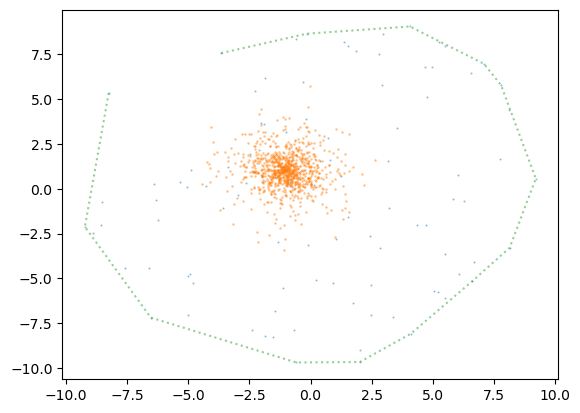

In [17]:
x0 = -1
y0 = 1
Re = 1
n = 1
fbkg = 0.1

nstars = 1000
Router = 10

truths1 = [x0, y0, Re, n, fbkg]

x, y, truenfg = sersic_plus_uniform_circle(nstars, fbkg, n=n, Re=Re, Router=Router, x0=x0, y0=y0)

xy_hull = spatial.ConvexHull(np.array((x, y)).T)

assert (nstars-truenfg) == fbkg*nstars, f'{nstars-truenfg} != {fbkg*nstars}'

plt.scatter(x[(truenfg-nstars):], y[(truenfg-nstars):], s=2, alpha=0.5, lw=0)
plt.scatter(x[:truenfg], y[:truenfg], s=3, alpha=0.5, lw=0)
plt.plot(*xy_hull.points[xy_hull.vertices].T, ':', alpha=.5, c='C2')
;

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 32     | 1        | 4        | 36612    | N/A    | 10001 | -3263.89 
Total time: 39.0s


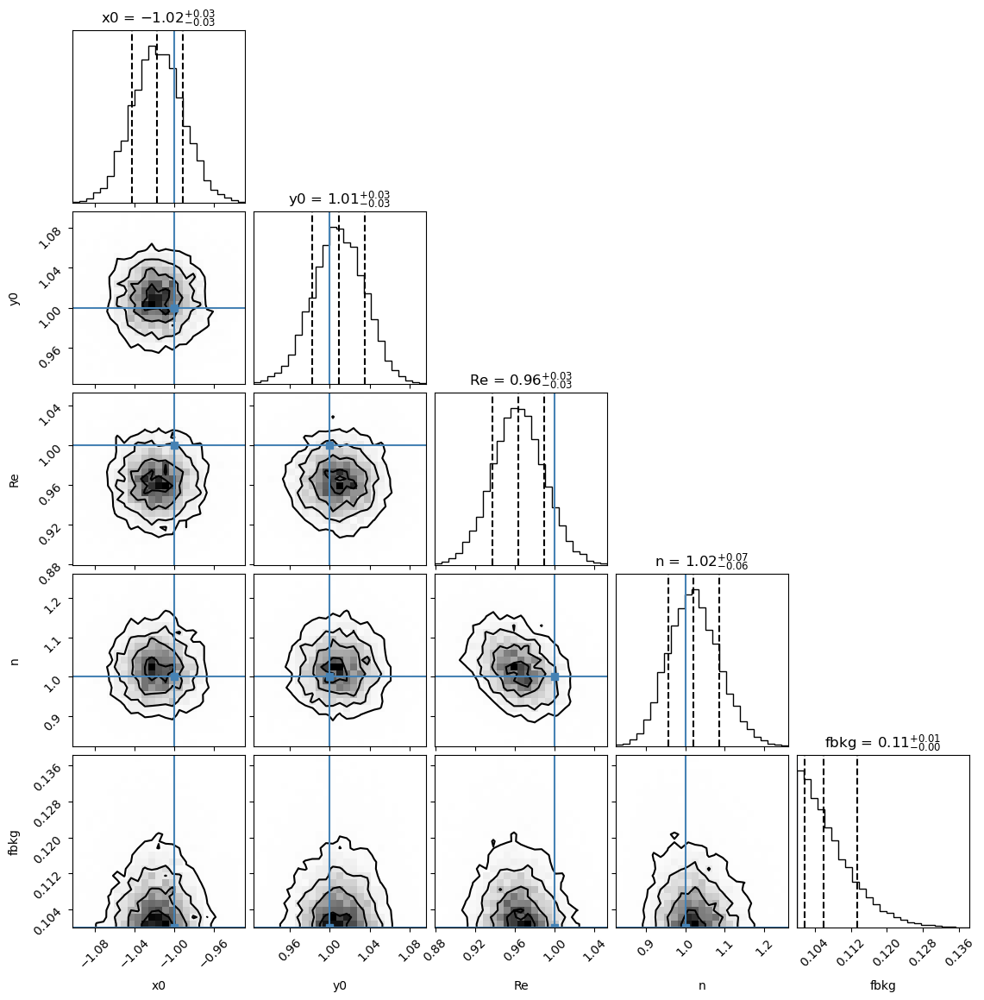

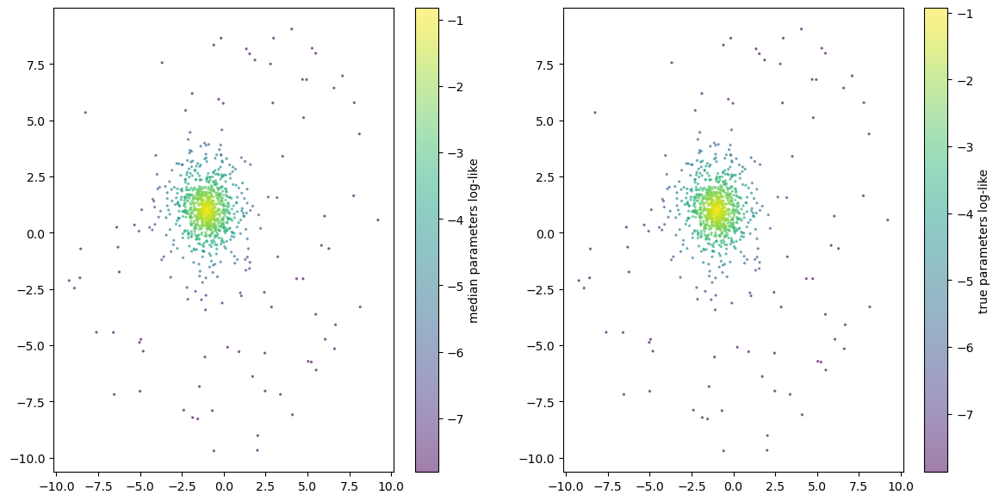

In [18]:
prior11 = nautilus.Prior()

prior11.add_parameter('x0', (-2, 2))
prior11.add_parameter('y0', (-2, 2))
prior11.add_parameter('Re', (0.1, 2))
prior11.add_parameter('n', (0.36, 4))
prior11.add_parameter('fbkg', (0.1, 0.9))


sampler11 = nautilus.Sampler(prior11, loglike, 
                           likelihood_kwargs=dict(data=(x, y), hull=xy_hull, n_per_segment=1000),
                           n_live=1000, pool=12)
t_start = time.time()
sampler11.run(verbose=True)
t_end = time.time()
print('Total time: {:.1f}s'.format(t_end - t_start))

plot_results(sampler11, truths=truths1)

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 25     | 1        | 4        | 28836    | N/A    | 10046 | -3258.34 
Total time: 29.3s


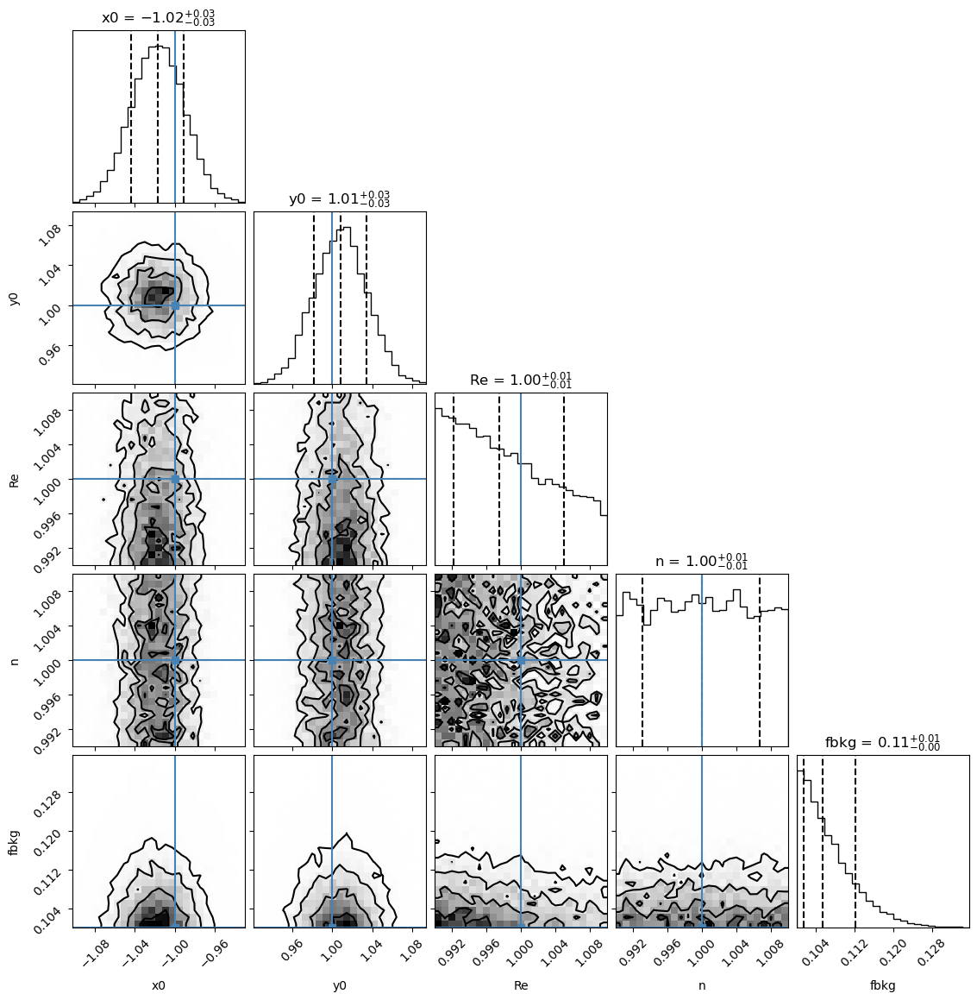

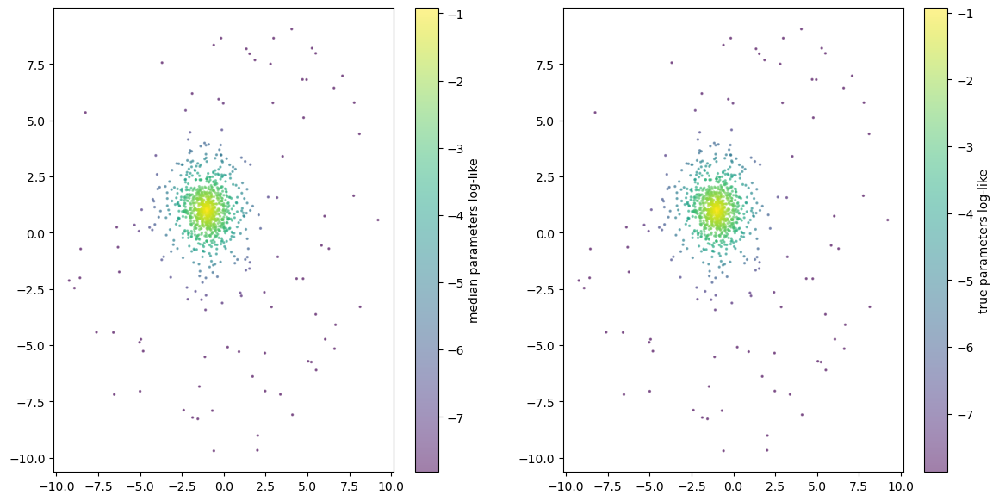

In [19]:
prior12 = nautilus.Prior()

prior12.add_parameter('x0', (-2, 2))
prior12.add_parameter('y0', (-2, 2))
prior12.add_parameter('Re', (0.99, 1.01))
prior12.add_parameter('n', (0.99, 1.01))
prior12.add_parameter('fbkg', (0.1, 0.9))


sampler12 = nautilus.Sampler(prior12, loglike, 
                           likelihood_kwargs=dict(data=(x, y), hull=xy_hull, n_per_segment=1000),
                           n_live=1000, pool=12)
t_start = time.time()
sampler12.run(verbose=True)
t_end = time.time()
print('Total time: {:.1f}s'.format(t_end - t_start))

plot_results(sampler12, truths=truths1)

## Or a large background fraction?

''

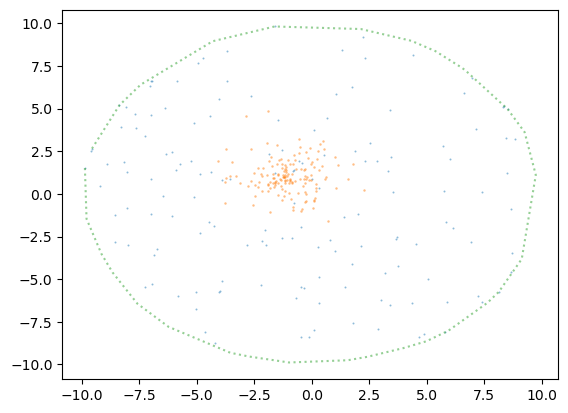

In [20]:
x0 = -1
y0 = 1
Re = 1
n = 1
fbkg = 0.85

nstars = 1000
Router = 10

truths2 = [x0, y0, Re, n, fbkg]

x, y, truenbkg = sersic_plus_uniform_circle(nstars, fbkg, n=n, Re=Re, Router=Router, x0=x0, y0=y0)

xy_hull = spatial.ConvexHull(np.array((x, y)).T)

assert (nstars-truenbkg) == fbkg*nstars, f'{nstars-truenbkg} != {fbkg*nstars}'

plt.scatter(x[-truenbkg:], y[-truenbkg:], s=2, alpha=0.5, lw=0)
plt.scatter(x[:truenbkg], y[:truenbkg], s=3, alpha=0.5, lw=0)
plt.plot(*xy_hull.points[xy_hull.vertices].T, ':', alpha=.5, c='C2')
;

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 23     | 1        | 4        | 26568    | N/A    | 10043 | -5591.90 
Total time: 34.3s


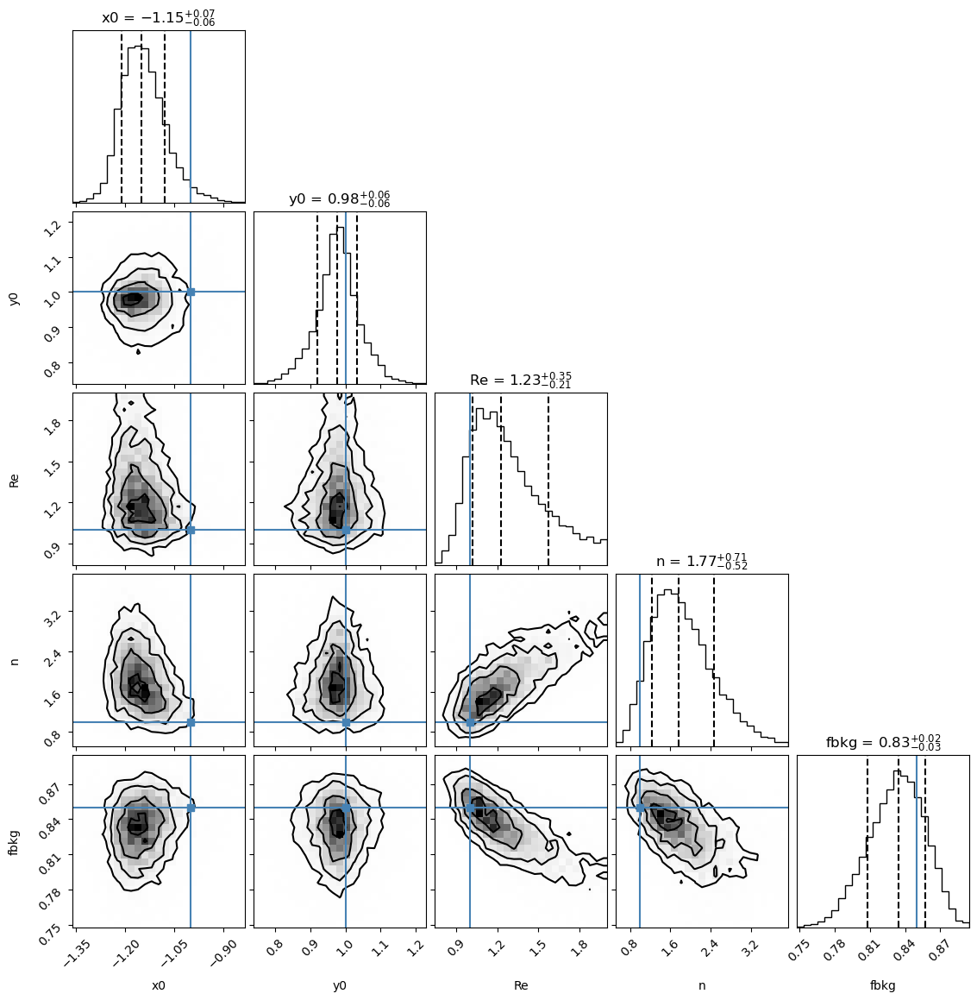

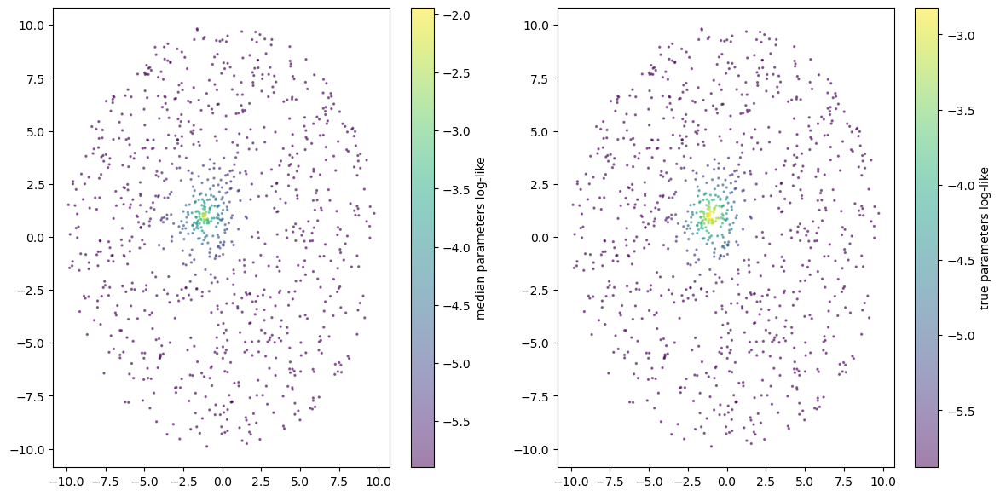

In [21]:
prior21 = nautilus.Prior()

prior21.add_parameter('x0', (-2, 2))
prior21.add_parameter('y0', (-2, 2))
prior21.add_parameter('Re', (0.1, 2))
prior21.add_parameter('n', (0.36, 4))
prior21.add_parameter('fbkg', (0.1, 0.9))


sampler21 = nautilus.Sampler(prior21, loglike, 
                           likelihood_kwargs=dict(data=(x, y), hull=xy_hull, n_per_segment=1000),
                           n_live=1000, pool=12)
t_start = time.time()
sampler21.run(verbose=True)
t_end = time.time()
print('Total time: {:.1f}s'.format(t_end - t_start))

plot_results(sampler21, truths=truths2)

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 19     | 1        | 4        | 23980    | N/A    | 10138 | -5589.89 
Total time: 27.2s


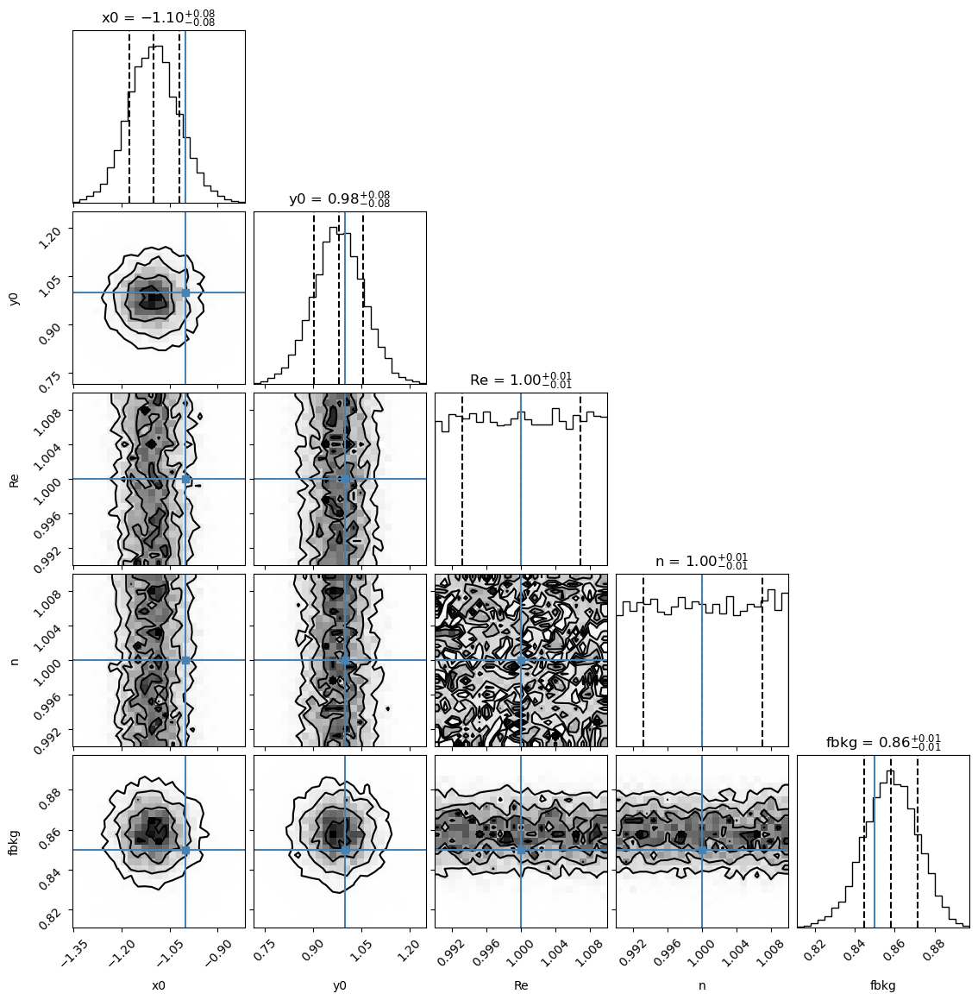

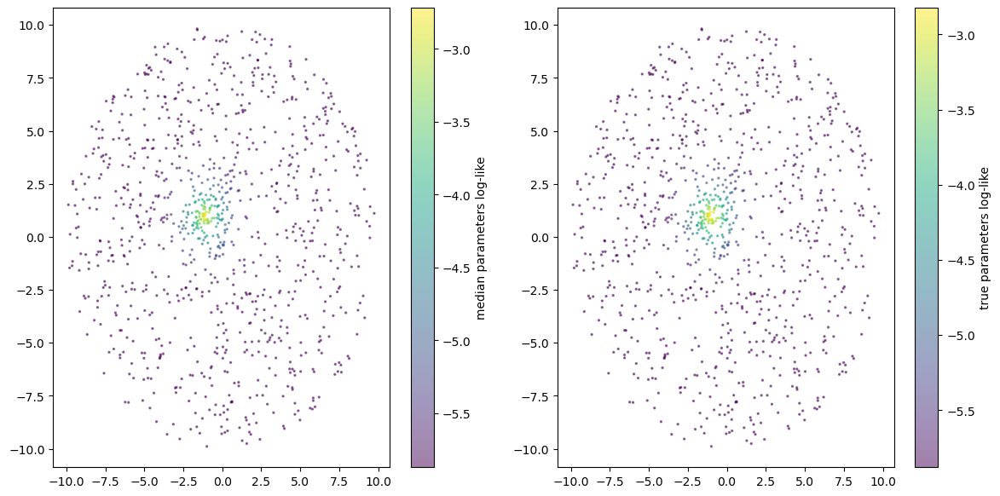

In [22]:
prior22 = nautilus.Prior()

prior22.add_parameter('x0', (-2, 2))
prior22.add_parameter('y0', (-2, 2))
prior22.add_parameter('Re', (0.99, 1.01))
prior22.add_parameter('n', (0.99, 1.01))
prior22.add_parameter('fbkg', (0.1, 0.9))


sampler22 = nautilus.Sampler(prior22, loglike, 
                           likelihood_kwargs=dict(data=(x, y), hull=xy_hull, n_per_segment=1000),
                           n_live=1000, pool=22)
t_start = time.time()
sampler22.run(verbose=True)
t_end = time.time()
print('Total time: {:.1f}s'.format(t_end - t_start))

plot_results(sampler22, truths=truths2)

## Larger sersic n?

''

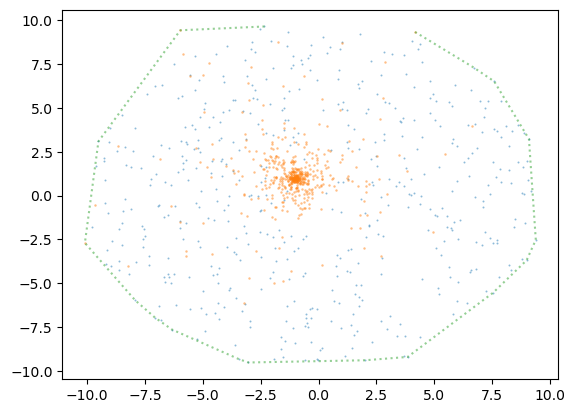

In [23]:
x0 = -1
y0 = 1
Re = 1
n = 3.8
fbkg = 0.5

nstars = 1000
Router = 10

truths3 = [x0, y0, Re, n, fbkg]

x, y, truenfg = sersic_plus_uniform_circle(nstars, fbkg, n=n, Re=Re, Router=Router, x0=x0, y0=y0)

xy_hull = spatial.ConvexHull(np.array((x, y)).T)

assert (nstars-truenfg) == fbkg*nstars, f'{nstars-truenfg} != {fbkg*nstars}'

plt.scatter(x[(truenfg-nstars):], y[(truenfg-nstars):], s=2, alpha=0.5, lw=0)
plt.scatter(x[:truenfg], y[:truenfg], s=3, alpha=0.5, lw=0)
plt.plot(*xy_hull.points[xy_hull.vertices].T, ':', alpha=.5, c='C2')
;

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 28     | 1        | 4        | 32508    | N/A    | 10052 | -4796.41 
Total time: 39.5s


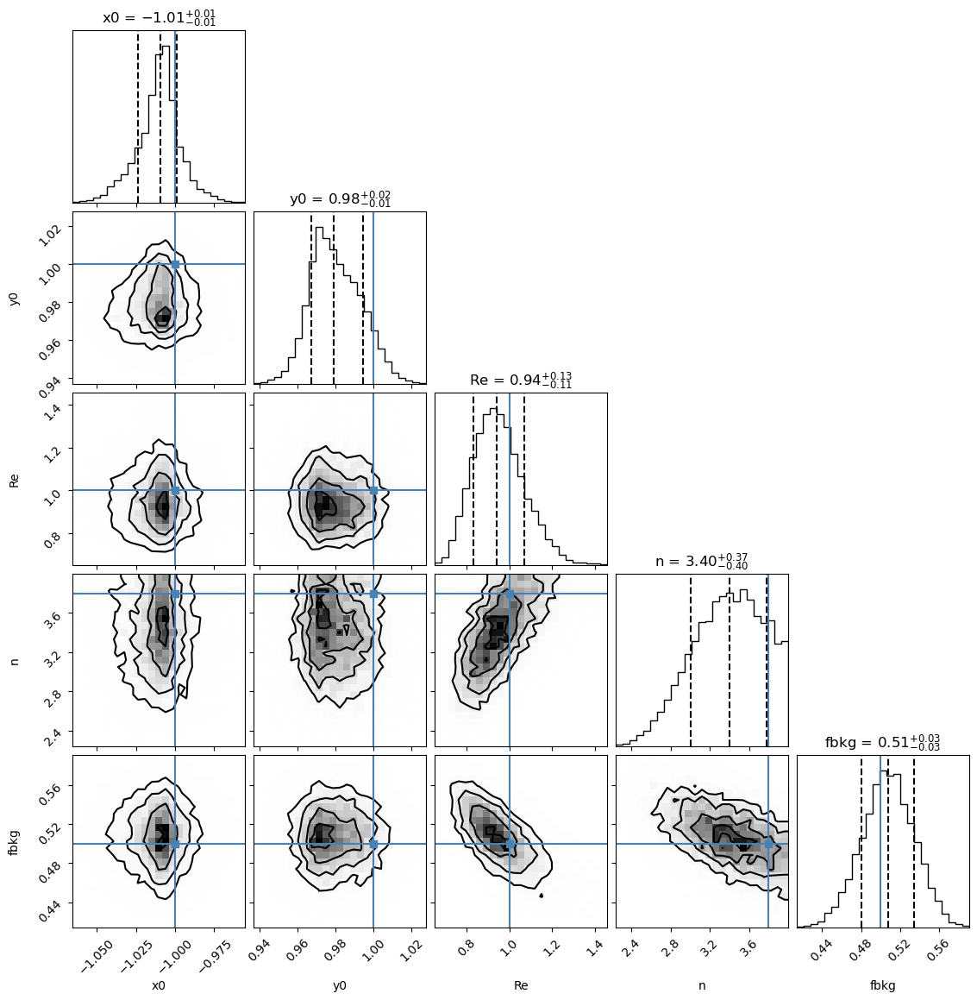

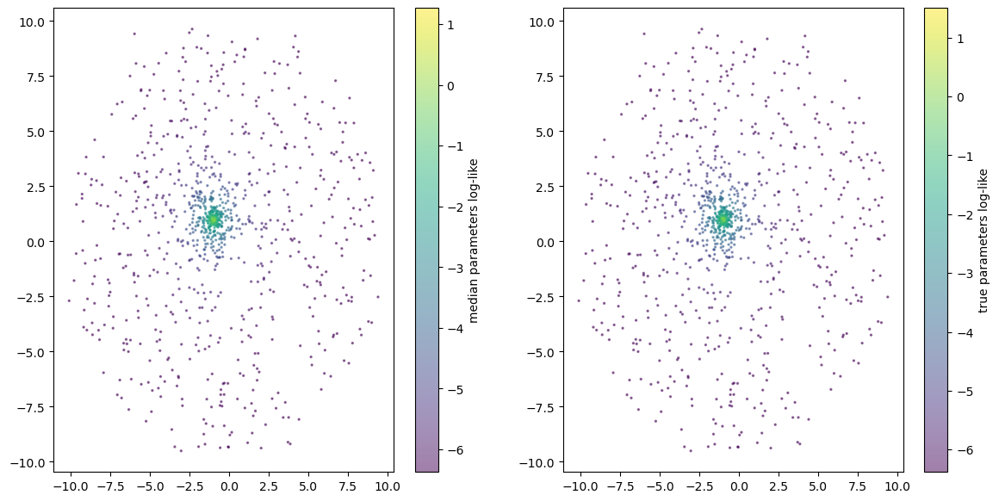

In [24]:
prior31 = nautilus.Prior()

prior31.add_parameter('x0', (-2, 2))
prior31.add_parameter('y0', (-2, 2))
prior31.add_parameter('Re', (0.1, 2))
prior31.add_parameter('n', (0.36, 4))
prior31.add_parameter('fbkg', (0.1, 0.9))


sampler31 = nautilus.Sampler(prior31, loglike, 
                           likelihood_kwargs=dict(data=(x, y), hull=xy_hull, n_per_segment=1000),
                           n_live=1000, pool=12)
t_start = time.time()
sampler31.run(verbose=True)
t_end = time.time()
print('Total time: {:.1f}s'.format(t_end - t_start))

plot_results(sampler31, truths=truths3)

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 27     | 1        | 4        | 31212    | N/A    | 10086 | -4795.33 
Total time: 37.2s


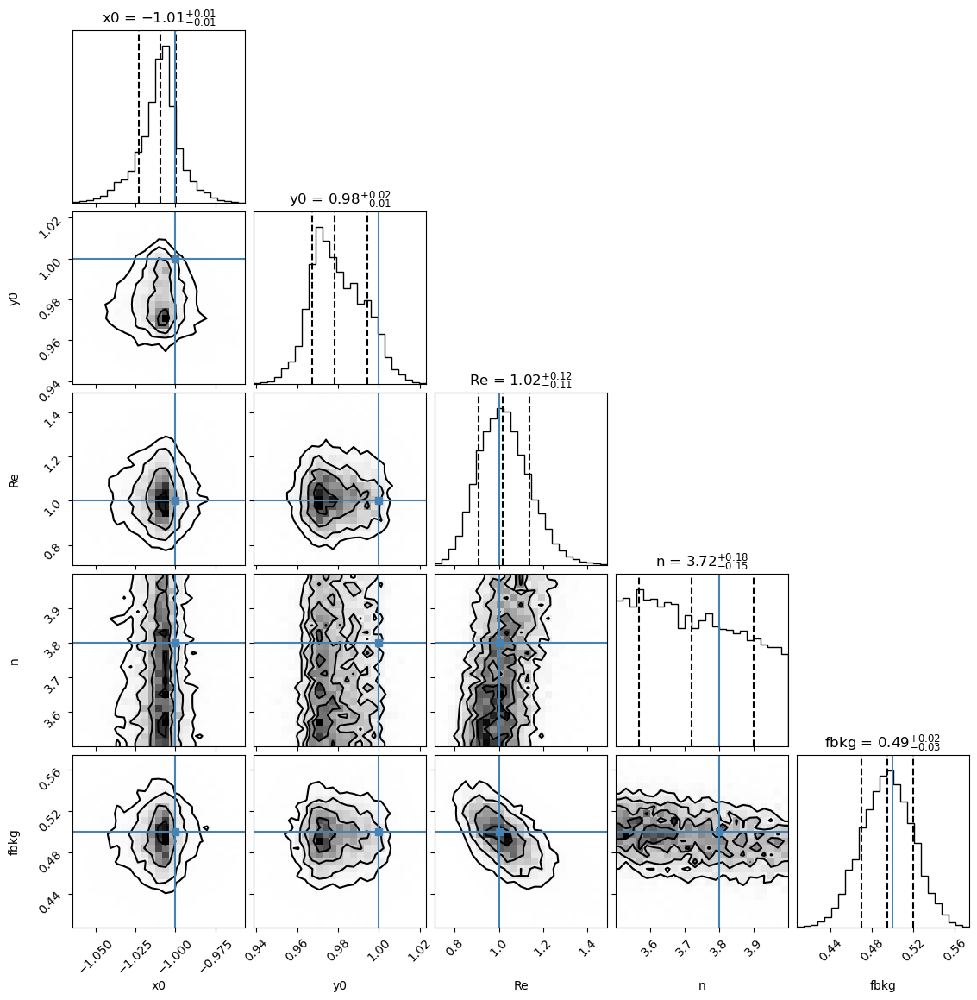

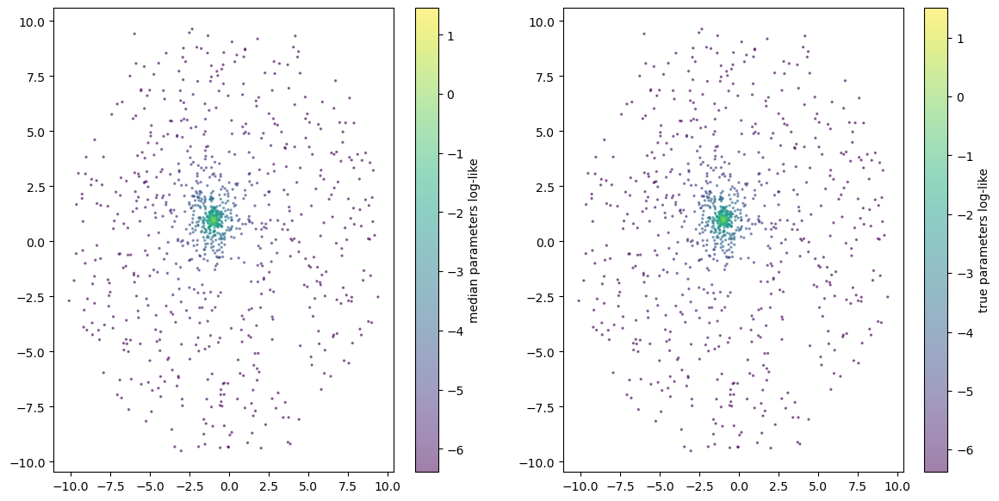

In [25]:
prior32 = nautilus.Prior()

prior32.add_parameter('x0', (-2, 2))
prior32.add_parameter('y0', (-2, 2))
prior32.add_parameter('Re', (0.1, 2))
prior32.add_parameter('n', (3.5, 4))
prior32.add_parameter('fbkg', (0.1, 0.9))


sampler32 = nautilus.Sampler(prior32, loglike, 
                           likelihood_kwargs=dict(data=(x, y), hull=xy_hull, n_per_segment=1000),
                           n_live=1000, pool=12)
t_start = time.time()
sampler32.run(verbose=True)
t_end = time.time()
print('Total time: {:.1f}s'.format(t_end - t_start))

plot_results(sampler32, truths=truths3)

# Evidence for or against glx

## Fiducial case

''

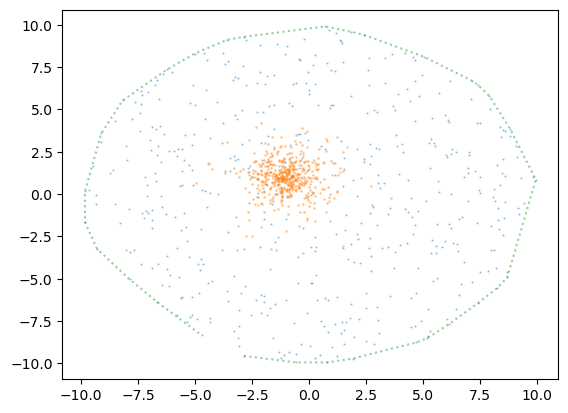

In [26]:
x0 = -1
y0 = 1
Re = 1
n = 1
fbkg = 0.5

nstars = 1000
Router = 10

truths = [x0, y0, Re, n, fbkg]

x, y, truenbkg = sersic_plus_uniform_circle(nstars, fbkg, n=n, Re=Re, Router=Router, x0=x0, y0=y0)

xy_hull = spatial.ConvexHull(np.array((x, y)).T)

assert (nstars-truenbkg) == fbkg*nstars, f'{nstars-truenbkg} != {fbkg*nstars}'

plt.scatter(x[-truenbkg:], y[-truenbkg:], s=2, alpha=0.5, lw=0)
plt.scatter(x[:truenbkg], y[:truenbkg], s=3, alpha=0.5, lw=0)
plt.plot(*xy_hull.points[xy_hull.vertices].T, ':', alpha=.5, c='C2')
;

In [27]:
prior = nautilus.Prior()

prior.add_parameter('x0', (-2, 2))
prior.add_parameter('y0', (-2, 2))
prior.add_parameter('Re', (0.1, 2))
prior.add_parameter('n', (0.36, 4))
prior.add_parameter('fbkg', (0., 1.0))

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 28     | 1        | 4        | 32076    | N/A    | 10010 | -4784.60 
Total time: 37.4s


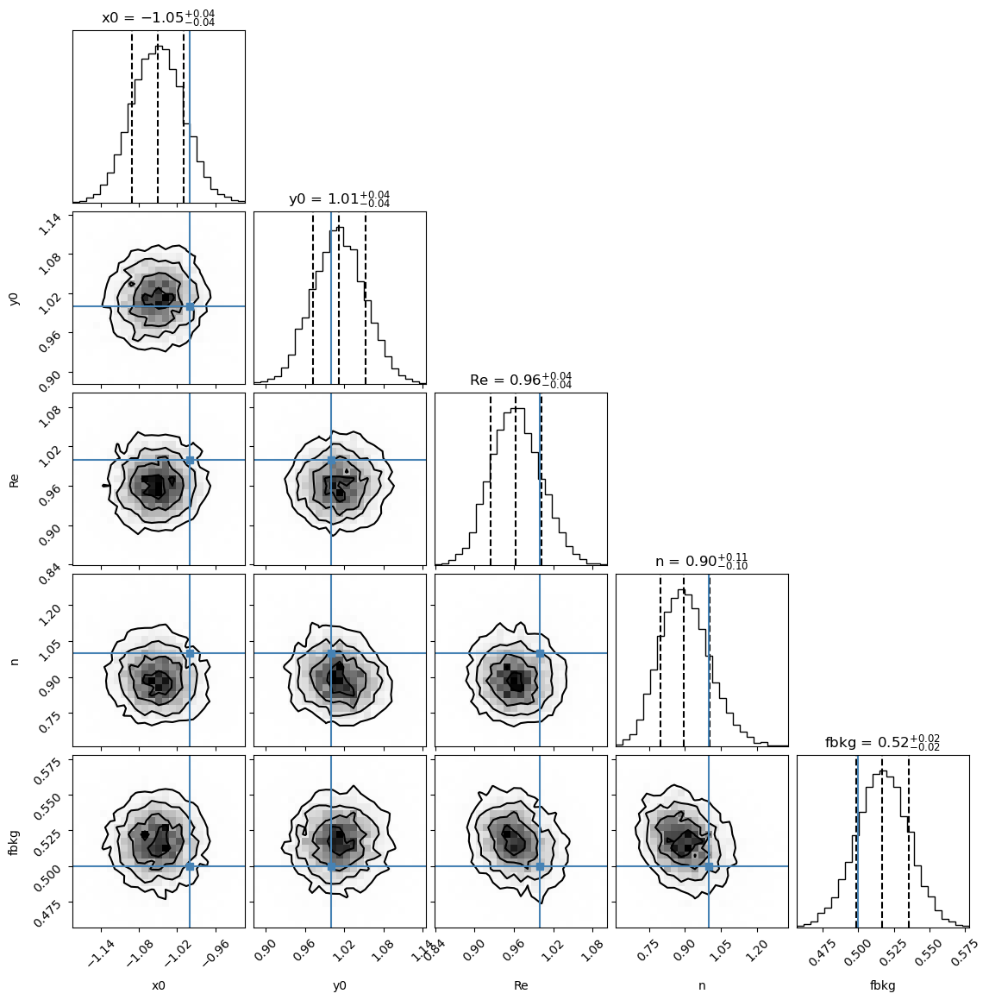

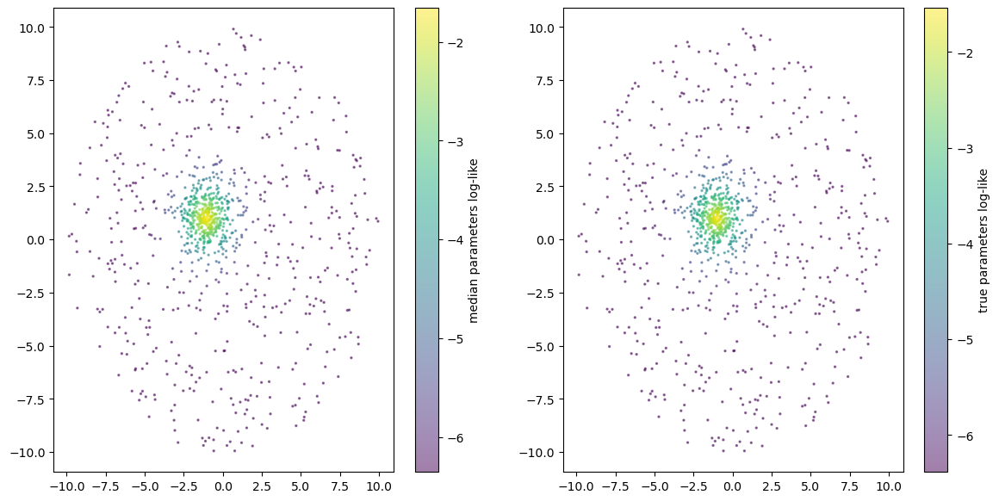

In [28]:
samplerglx = nautilus.Sampler(prior, loglike, 
                           likelihood_kwargs=dict(data=(x, y), hull=xy_hull, n_per_segment=1000),
                           n_live=1000, pool=12)
t_start = time.time()
samplerglx.run(verbose=True)
t_end = time.time()
print('Total time: {:.1f}s'.format(t_end - t_start))

plot_results(samplerglx, truths=truths)

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 1      | 0        | 0        | 100008   | N/A    | 100008 | -5692.23
Total time: 22.2s


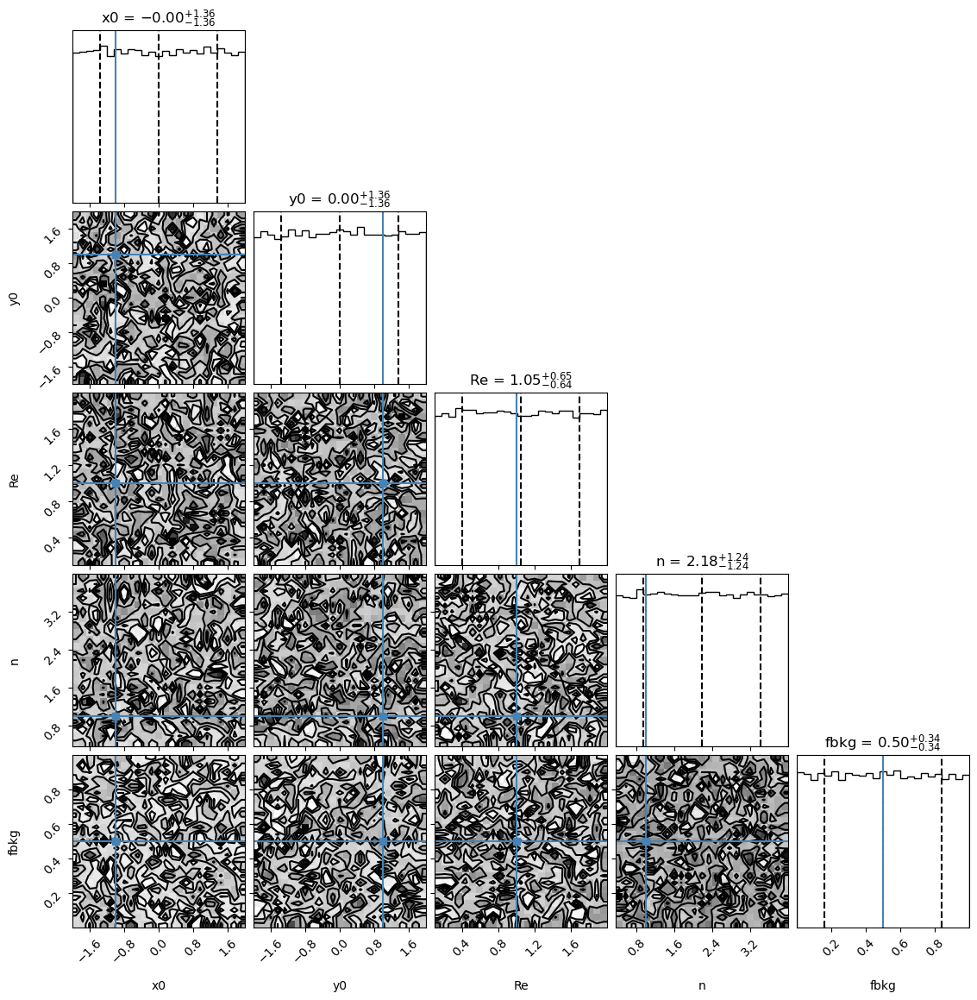

In [29]:

samplernoglx = nautilus.Sampler(prior, loglike, 
                           likelihood_kwargs=dict(data=(x, y), hull=xy_hull, n_per_segment=1000, noglx=True),
                           n_live=1000, pool=12)
t_start = time.time()
samplernoglx.run(verbose=True)
t_end = time.time()
print('Total time: {:.1f}s'.format(t_end - t_start))

plot_results(samplernoglx, truths=truths, showsky=False)  # the sky plot isn't really right

In [30]:
samplerglx.log_z - samplernoglx.log_z, (samplerglx.log_z - samplernoglx.log_z)/np.log(10), samplerglx.log_z, samplernoglx.log_z

(np.float64(907.6335105893195),
 np.float64(394.1802252394181),
 np.float64(-4784.600771560388),
 np.float64(-5692.234282149708))

Well that's pretty darn decisive.  

## larger background fraction

''

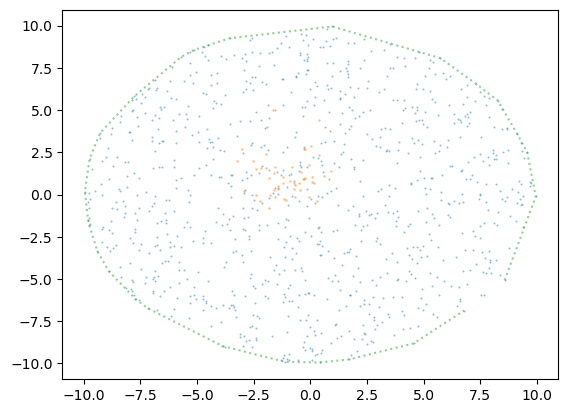

In [31]:
x0 = -1
y0 = 1
Re = 1
n = 1
fbkg = 0.95

nstars = 1000
Router = 10

truths = [x0, y0, Re, n, fbkg]

x, y, truenfg = sersic_plus_uniform_circle(nstars, fbkg, n=n, Re=Re, Router=Router, x0=x0, y0=y0)

xy_hull = spatial.ConvexHull(np.array((x, y)).T)

assert (nstars-truenfg) == fbkg*nstars, f'{nstars-truenfg} != {fbkg*nstars}'

plt.scatter(x[(truenfg-nstars):], y[(truenfg-nstars):], s=2, alpha=0.5, lw=0)
plt.scatter(x[:truenfg], y[:truenfg], s=3, alpha=0.5, lw=0)
plt.plot(*xy_hull.points[xy_hull.vertices].T, ':', alpha=.5, c='C2')
;

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 21     | 1        | 4        | 23328    | N/A    | 10008 | -5699.61 
Total time: 29.8s


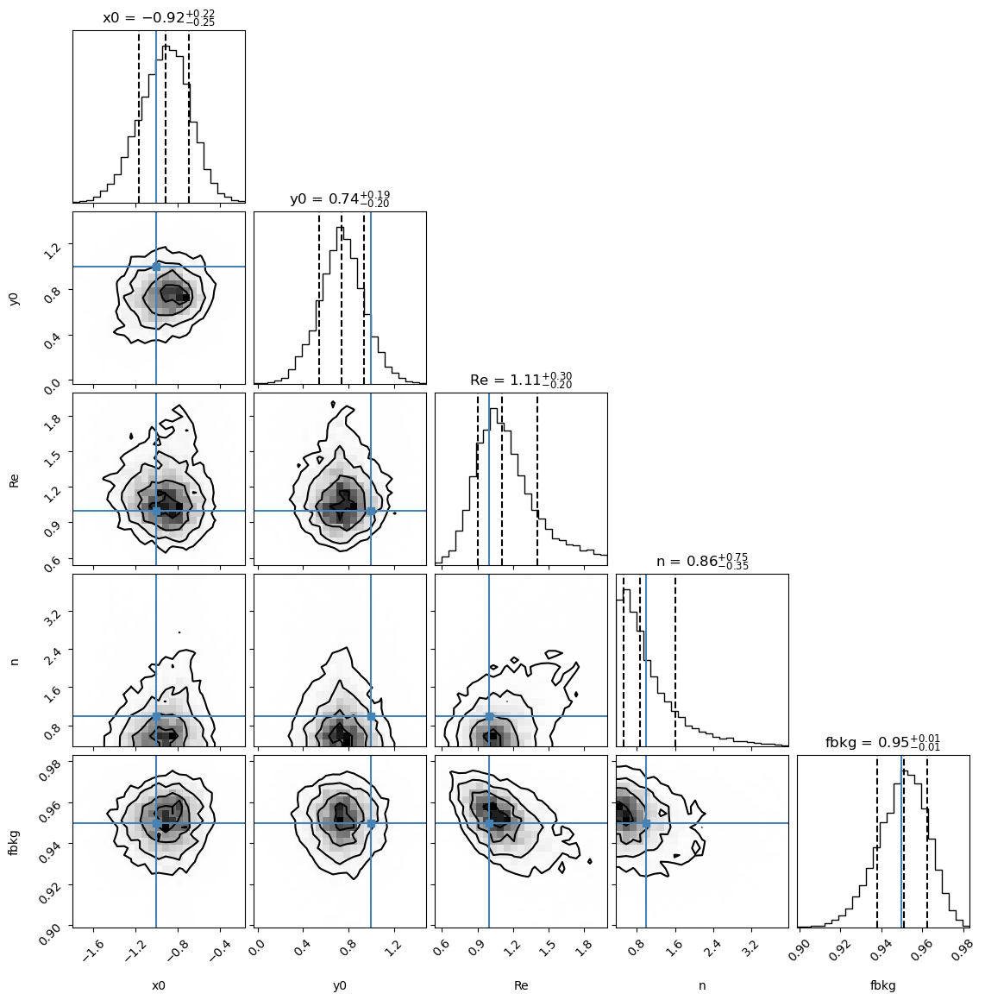

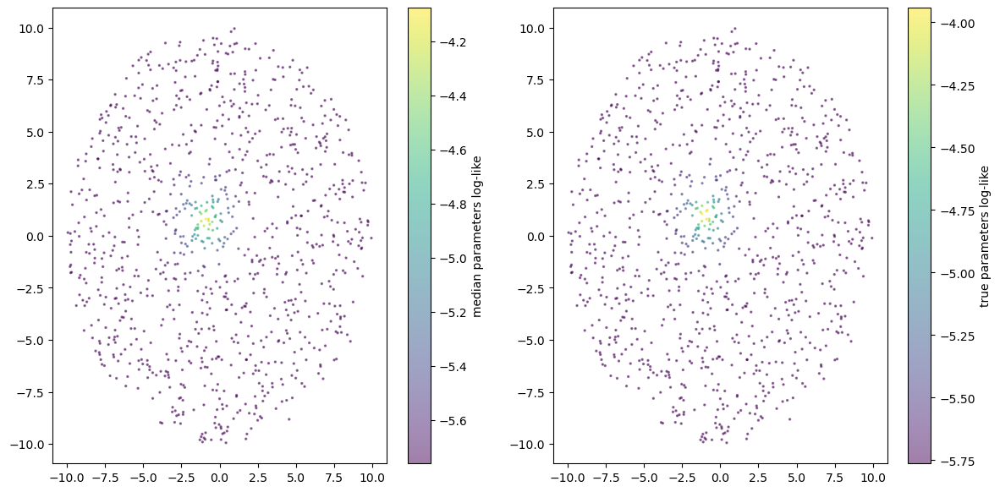

In [32]:
samplerglx = nautilus.Sampler(prior, loglike, 
                           likelihood_kwargs=dict(data=(x, y), hull=xy_hull, n_per_segment=1000),
                           n_live=1000, pool=12)
t_start = time.time()
samplerglx.run(verbose=True)
t_end = time.time()
print('Total time: {:.1f}s'.format(t_end - t_start))

plot_results(samplerglx, truths=truths)

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 1      | 0        | 0        | 100008   | N/A    | 100008 | -5711.59
Total time: 21.9s


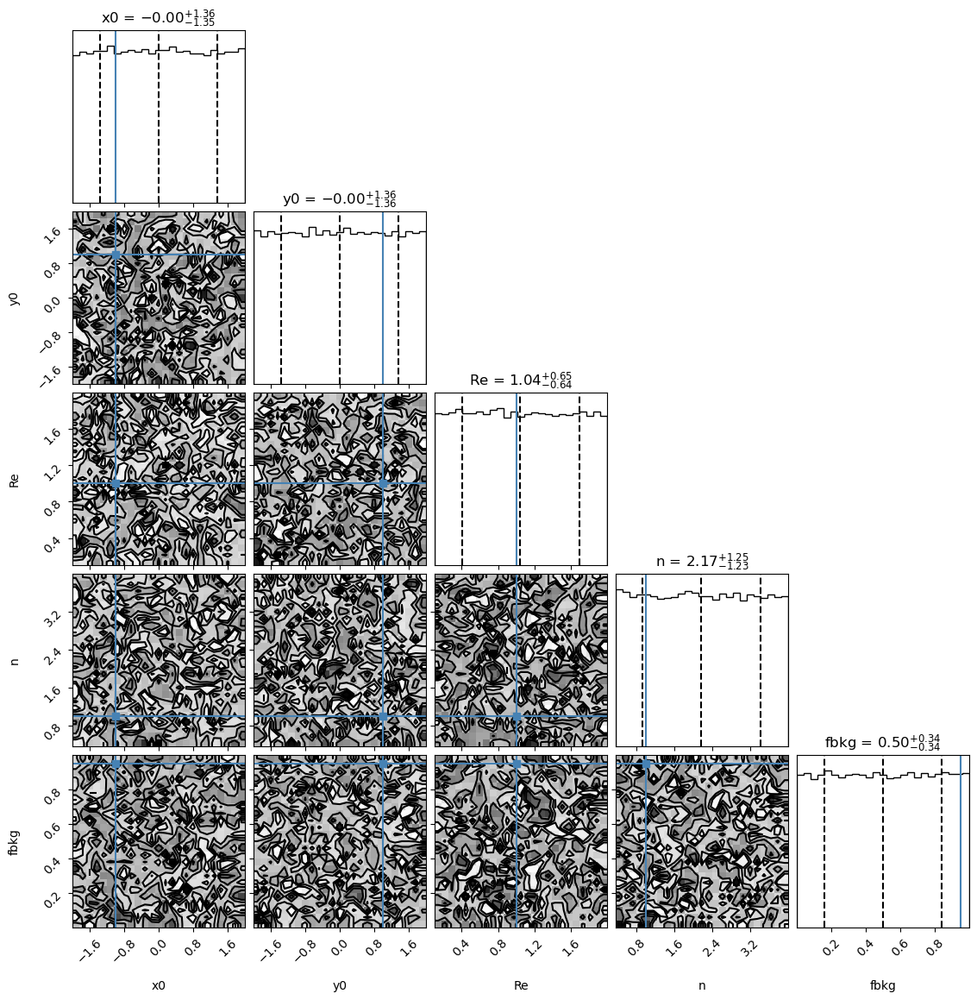

In [33]:

samplernoglx = nautilus.Sampler(prior, loglike, 
                           likelihood_kwargs=dict(data=(x, y), hull=xy_hull, n_per_segment=1000, noglx=True),
                           n_live=1000, pool=12)
t_start = time.time()
samplernoglx.run(verbose=True)
t_end = time.time()
print('Total time: {:.1f}s'.format(t_end - t_start))

plot_results(samplernoglx, truths=truths, showsky=False)  # the sky plot isn't really right

In [34]:
samplerglx.log_z - samplernoglx.log_z, (samplerglx.log_z - samplernoglx.log_z)/np.log(10), samplerglx.log_z, samplernoglx.log_z

(np.float64(11.978130550842252),
 np.float64(5.2020360017475475),
 np.float64(-5699.61118833108),
 np.float64(-5711.589318881922))

Well that seems a bit overconfident... but maybe not crazily so?

## smaller numbers?

''

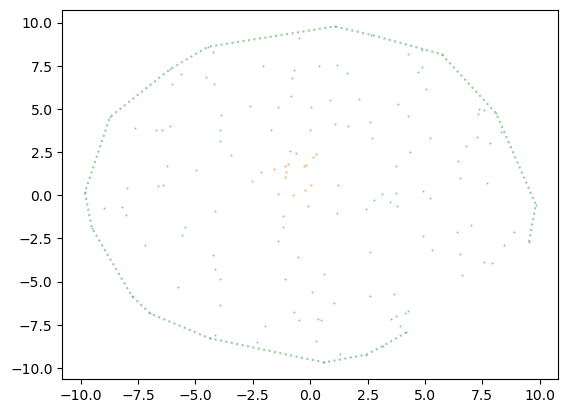

In [35]:
x0 = -1
y0 = 1
Re = 1
n = 1
fbkg = 0.9

nstars = 150
Router = 10

truths = [x0, y0, Re, n, fbkg]

x, y, truenfg = sersic_plus_uniform_circle(nstars, fbkg, n=n, Re=Re, Router=Router, x0=x0, y0=y0)

xy_hull = spatial.ConvexHull(np.array((x, y)).T)

assert (nstars-truenfg) == fbkg*nstars, f'{nstars-truenfg} != {fbkg*nstars}'

plt.scatter(x[(truenfg-nstars):], y[(truenfg-nstars):], s=2, alpha=0.5, lw=0)
plt.scatter(x[:truenfg], y[:truenfg], s=3, alpha=0.5, lw=0)
plt.plot(*xy_hull.points[xy_hull.vertices].T, ':', alpha=.5, c='C2')
;

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 17     | 3        | 4        | 20844    | N/A    | 10094 | -843.19  
Total time: 33.2s


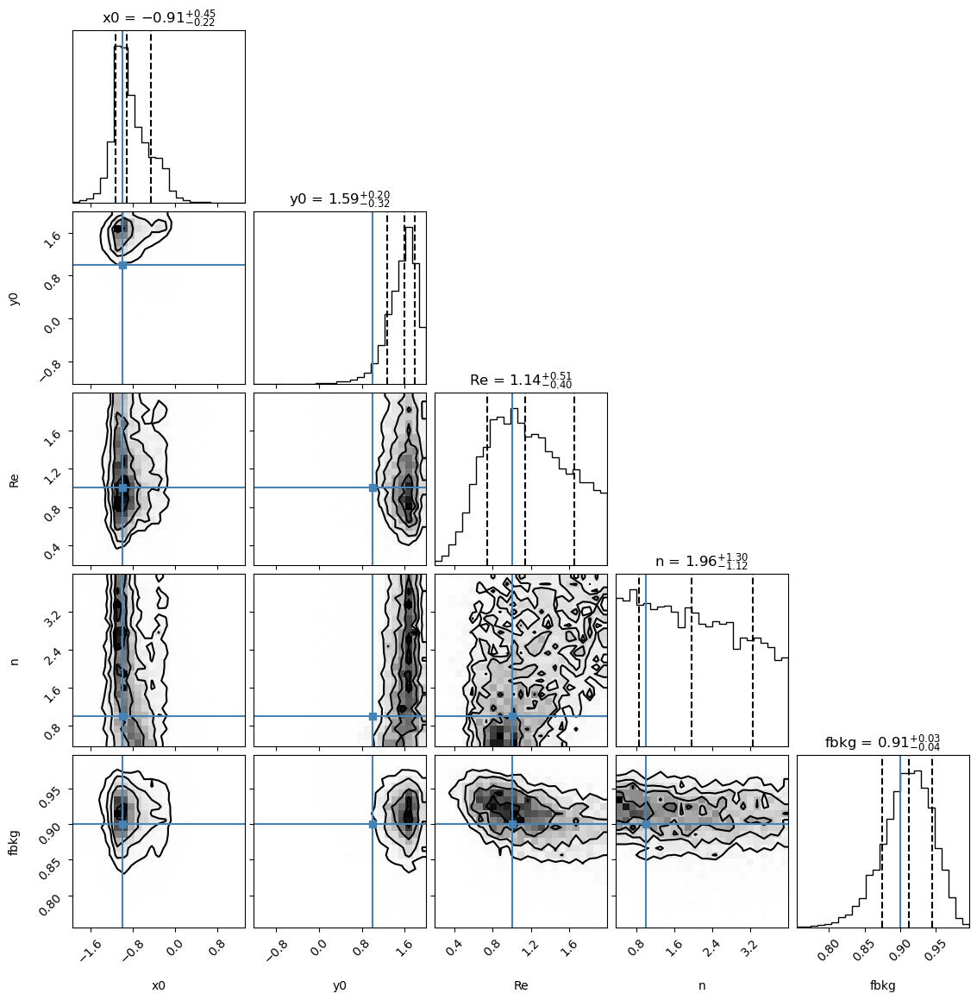

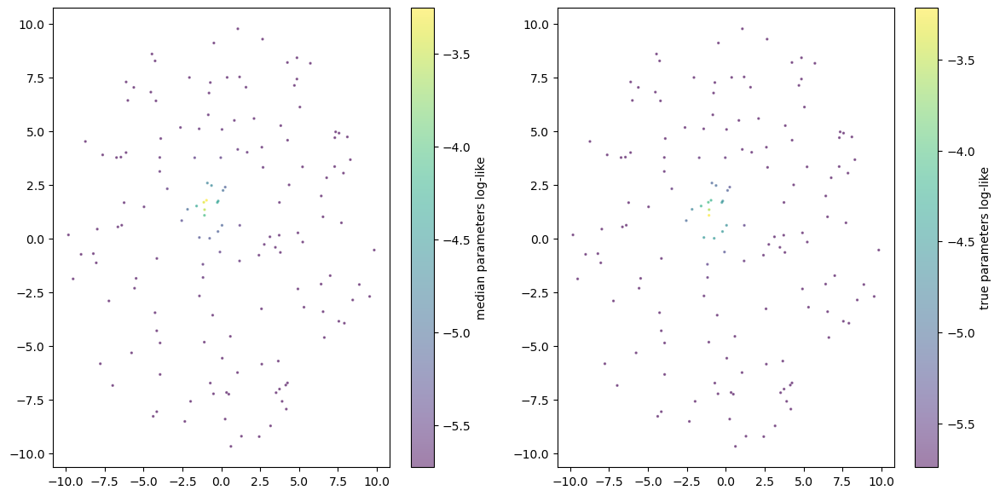

In [36]:
samplerglx = nautilus.Sampler(prior, loglike, 
                           likelihood_kwargs=dict(data=(x, y), hull=xy_hull, n_per_segment=1000),
                           n_live=1000, pool=12)
t_start = time.time()
samplerglx.run(verbose=True)
t_end = time.time()
print('Total time: {:.1f}s'.format(t_end - t_start))

plot_results(samplerglx, truths=truths)

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 1      | 0        | 0        | 100008   | N/A    | 100008 | -845.46 
Total time: 22.2s


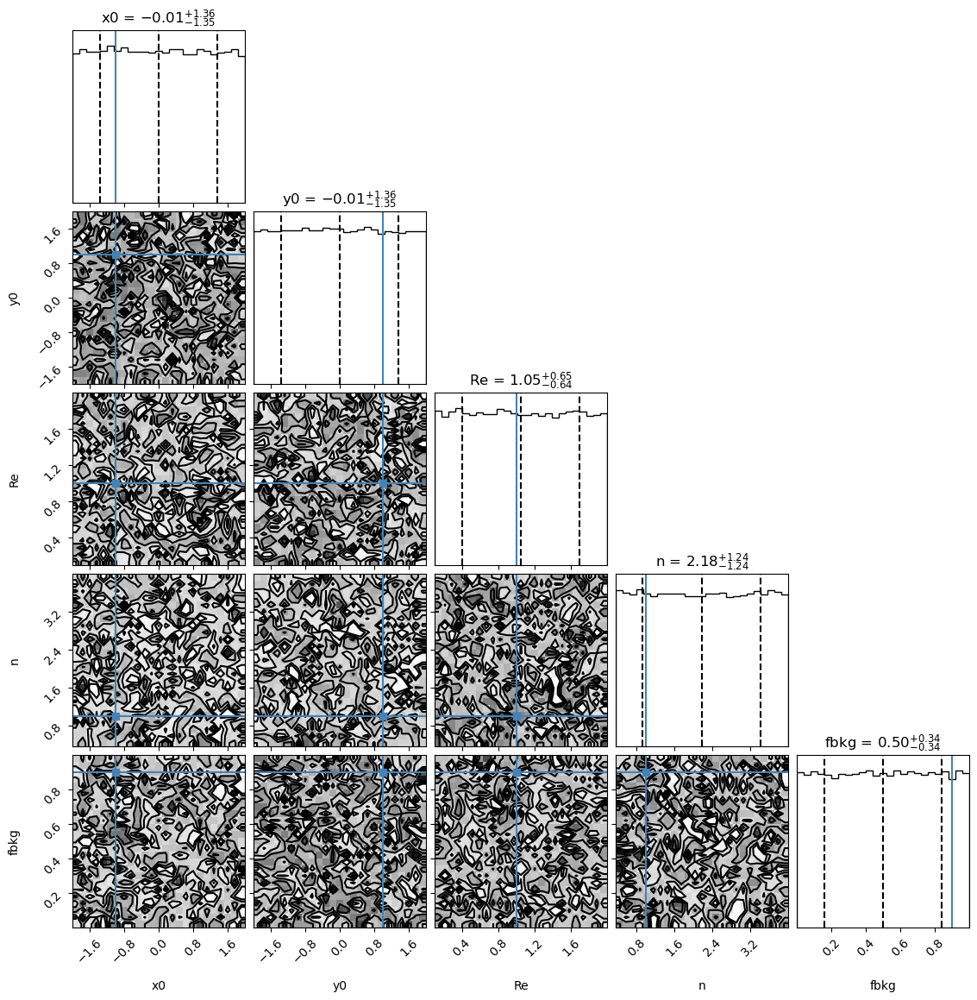

In [37]:

samplernoglx = nautilus.Sampler(prior, loglike, 
                           likelihood_kwargs=dict(data=(x, y), hull=xy_hull, n_per_segment=1000, noglx=True),
                           n_live=1000, pool=12)
t_start = time.time()
samplernoglx.run(verbose=True)
t_end = time.time()
print('Total time: {:.1f}s'.format(t_end - t_start))

plot_results(samplernoglx, truths=truths, showsky=False)  # the sky plot isn't really right

In [38]:
samplerglx.log_z - samplernoglx.log_z, (samplerglx.log_z - samplernoglx.log_z)/np.log(10), samplerglx.log_z, samplernoglx.log_z

(np.float64(2.264488687996277),
 np.float64(0.9834549415291175),
 np.float64(-843.1913441976013),
 np.float64(-845.4558328855976))

Aha, there we get something that's more like what you might expect. Huzzah!